In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import scipy.stats as stats
from sklearn.decomposition import PCA
import matplotlib
matplotlib.rcParams['figure.dpi'] = 500

def plot_pca(data,labels):
    tmp = data
    pca = PCA(n_components=2)
    pca.fit(tmp)
    loads = pca.transform(tmp)
    var_explained = np.round(100*pca.explained_variance_ratio_,2)
    plt.figure()
    plt.xlabel("PC1 (" + str(var_explained[0]) + "%)")
    plt.ylabel("PC2 (" + str(var_explained[1]) + "%)")
    plt.scatter(loads[:,0],loads[:,1],c=labels,s=15,alpha=.5)
    plt.colorbar()
    

In [2]:
datadir = "../data/"
plotdir = "../plots/"
metadataFn = "LLFS_Experiment_parameters_v7_excluded.csv"
dataFns = ["peak_areas_lipid_pos_imputted_Random Forest_normalized.csv","peak_areas_polar_neg_imputted_Random Forest_normalized.csv"]
#dataFns = ["peak_areas_lipid_pos_imputted.csv","peak_areas_polar_neg_imputted.csv"]

In [3]:
metadata = pd.read_csv(datadir + metadataFn,index_col=0)
metadata

,Unnamed: 0,File name lipids pos,File name lipids neg,File name metabolites pos,File name metabolites neg,Batch analysis,Batch list,Batch list #,Sample type,Metabolomics-Identifier,...,sex,age,collectdate,drawtime,receivedate,receivetime,interval_hrs,spouse_controls,Acq times for File name metabolites neg,found matching File name metabolites neg
peak area sample name,,,,,,,,,,,,,,,,,,,,,
Batch11_QC_01,6,BatchA_pL_QC_splash_01,BatchA_nL_QC_splash_01,BatchA_pP_QC_01,BatchA_nP_QC_01,A,Batch11,11,QC,QC_01,...,none,none,none,none,none,none,none,none,2021-04-12T09:23:00,True
Batch11_27754655_1,8,BatchA_pL_27754655_1,BatchA_nL_27754655_1,BatchA_pP_27754655_1,BatchA_nP_27754655_1,A,Batch11,11,Sample,27754655_1,...,2,98,16-Dec-08,8:45,17-Dec-08,12:23:00,28,No,2021-04-12T09:46:00,True
Batch11_29898244_1,9,BatchA_pL_29898244_1,BatchA_nL_29898244_1,BatchA_pP_29898244_1,BatchA_nP_29898244_1,A,Batch11,11,Sample,29898244_1,...,2,100,20-Nov-06,U,21-Nov-06,10:45:00,0,No,2021-04-12T10:09:00,True
Batch11_21170212_1,10,BatchA_pL_21170212_1,BatchA_nL_21170212_1,BatchA_pP_21170212_1,BatchA_nP_21170212_1,A,Batch11,11,Sample,21170212_1,...,2,61,28-Jan-08,8:15,29-Jan-08,10:45:00,26,No,2021-04-12T10:32:00,True
Batch11_22647044_1,11,BatchA_pL_22647044_1,BatchA_nL_22647044_1,BatchA_pP_22647044_1,BatchA_nP_22647044_1,A,Batch11,11,Sample,22647044_1,...,1,87,14-Jan-08,11:00,15-Jan-08,10:07:00,23,No,2021-04-12T10:55:00,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Batch1_14068365_1,2396,BatchV_pL_14068365_1,BatchV_nL_14068365_1,BatchV_pP_14068365_1,BatchV_nP_14068365_1,V,Batch1,1,Sample,14068365_1,...,2,101,28-Feb-07,8:00,7-Aug-07,11:39:00,3843,No,2021-06-19T19:53:00,True
Batch1_12245917_1,2397,BatchV_pL_12245917_1,BatchV_nL_12245917_1,BatchV_pP_12245917_1,BatchV_nP_12245917_1,V,Batch1,1,Sample,12245917_1,...,2,60,30-Oct-08,7:35,16-Dec-08,10:19:00,1131,No,2021-06-19T20:16:00,True
Batch1_19550962_1,2398,BatchV_pL_19550962_1,BatchV_nL_19550962_1,BatchV_pP_19550962_1,BatchV_nP_19550962_1,V,Batch1,1,Sample,19550962_1,...,1,59,21-May-07,8:35,27-Aug-07,15:14:00,2359,Yes,2021-06-19T20:39:00,True


In [4]:
data = pd.read_csv(datadir + dataFns[0],index_col=0)
data = pd.concat((data,pd.read_csv(datadir + dataFns[1],index_col=0)),axis=0,ignore_index=False).transpose().transform(np.log2)
data = data.loc[metadata.index.values,:]
data_mat = data.to_numpy()
data

,ACar 10:0,ACar 10:1,ACar 11:1,ACar 12:1,ACar 13:1,ACar 14:1,ACar 4:0,ACar 8:0,dCer_NS 39:1,dCer_NS 33:1,...,U13C-U15N-Methionine,U13C-U15N-Proline,U13C-U15N-Glutamate,U13C-U15N-Leucine,U13C-U15N-Isoleucine,U13C-U15N-Lysine,U13C-U15N-Arginine,U13C-U15N-Histidine,U13C-U15N-Phenylalanine,U13C-U15N-Tyrosine
Batch11_QC_01,18.026053,17.785328,15.430944,17.200082,15.098733,16.583795,15.936219,17.087913,16.618489,15.787062,...,22.325004,20.384415,22.915891,23.623751,23.187950,14.611763,18.096945,23.308549,24.249407,23.055430
Batch11_27754655_1,20.781594,21.026375,18.085580,19.832761,17.118135,18.912851,16.767978,20.001307,19.683915,19.181837,...,22.208127,20.282288,22.820468,23.551716,23.076036,14.448719,17.916198,23.298008,24.214539,22.979073
Batch11_29898244_1,19.367911,19.322345,17.807061,18.634907,15.904541,17.889705,16.605900,18.101328,19.118311,18.501888,...,22.281787,20.299947,22.543921,23.591560,23.120695,15.072101,18.115308,23.225122,24.081526,22.977596
Batch11_21170212_1,19.414980,19.256315,16.570688,18.041694,15.449535,17.694923,17.249357,18.770515,20.113503,19.618242,...,22.416844,20.369828,22.374477,23.662098,23.142622,14.978525,18.191895,23.138925,24.248732,23.011997
Batch11_22647044_1,18.714800,18.996226,17.774074,18.046773,17.179221,17.678495,17.236018,17.714023,18.894966,18.195270,...,22.199532,20.258593,23.077341,23.517696,23.009164,15.484083,18.417100,23.409029,24.178250,22.916444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Batch1_14068365_1,18.002464,17.652683,16.167172,17.242747,15.529612,16.316448,16.579225,17.327707,17.434187,16.958758,...,22.368679,20.266846,22.602735,23.596914,23.159771,15.314522,18.418235,23.309052,24.228348,22.970088
Batch1_12245917_1,18.445580,17.515126,16.022271,17.498830,15.318191,16.974522,16.735316,17.159987,16.495234,15.121209,...,22.444109,20.311597,22.654750,23.604794,23.152370,14.960343,18.439646,23.237969,24.251391,23.045380
Batch1_19550962_1,19.403858,18.876069,17.047949,18.586880,15.553492,17.772235,16.555900,18.278520,17.021881,16.136746,...,22.254382,20.230936,22.709673,23.508197,23.037421,14.755286,18.462943,23.328833,24.170810,22.969795
Batch1_15676422_1,19.546751,18.557041,16.918365,17.676480,15.974949,17.436358,16.410616,18.305580,17.168418,16.743690,...,22.278173,20.282308,22.757463,23.557889,23.143456,14.463421,17.826099,23.283192,24.287496,23.018498


In [5]:
qc_inds = [x for x in range(len(metadata)) if "QC" in metadata.at[metadata.index.values[x],"Sample type"]]
samp_inds = [x for x in range(len(metadata)) if x not in qc_inds]
print(len(qc_inds),len(samp_inds))

197 2001


c:\users\ethan\appdata\local\programs\python\python37\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


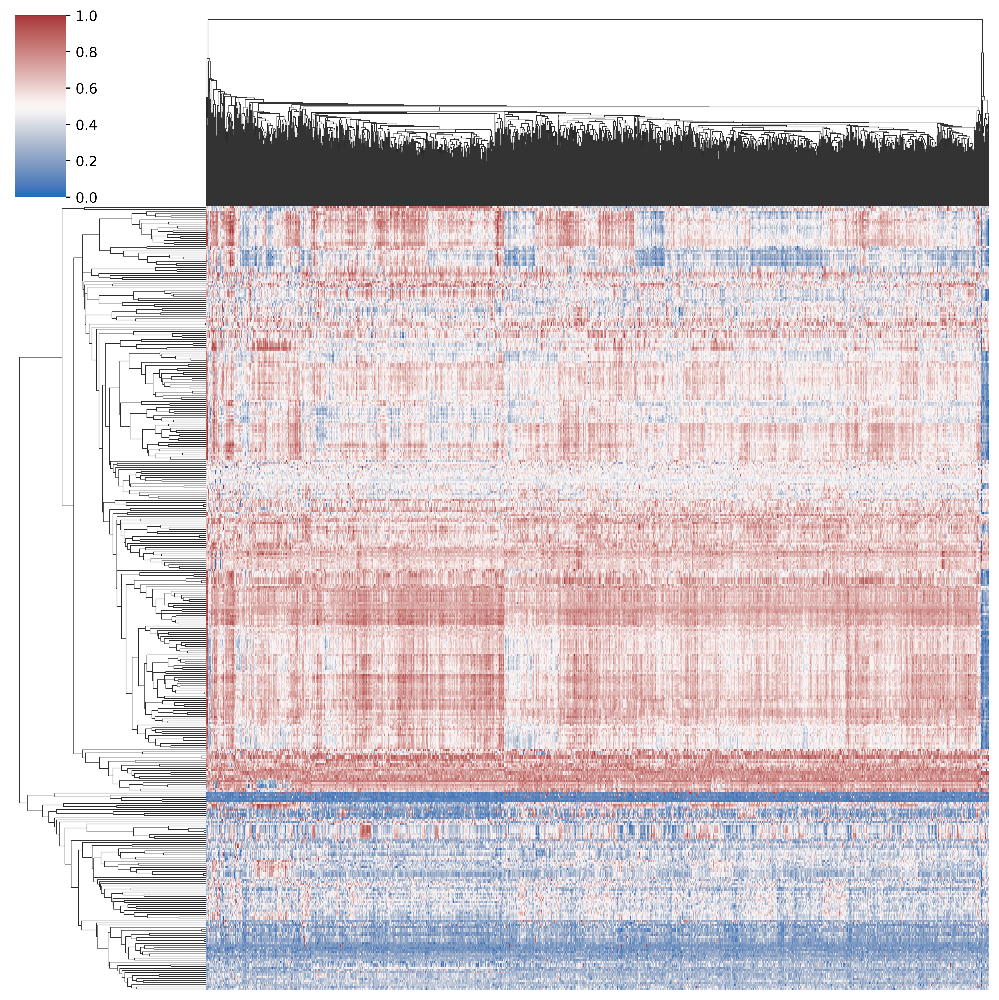

In [6]:
sb.clustermap(data.iloc[samp_inds,:].transpose(),standard_scale=0,yticklabels=False,xticklabels=False,cmap="vlag")

5
['PC 38:7' 'PC 32:2' 'PC 34:3' 'SM d40:2' 'alpha-Hydroxyhippuric acid']


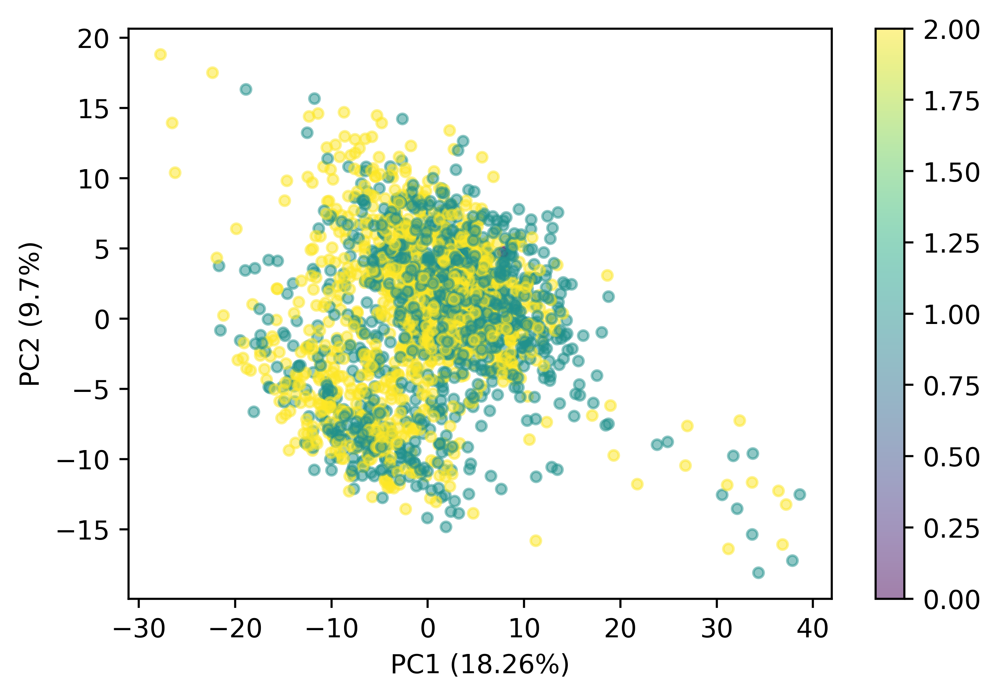

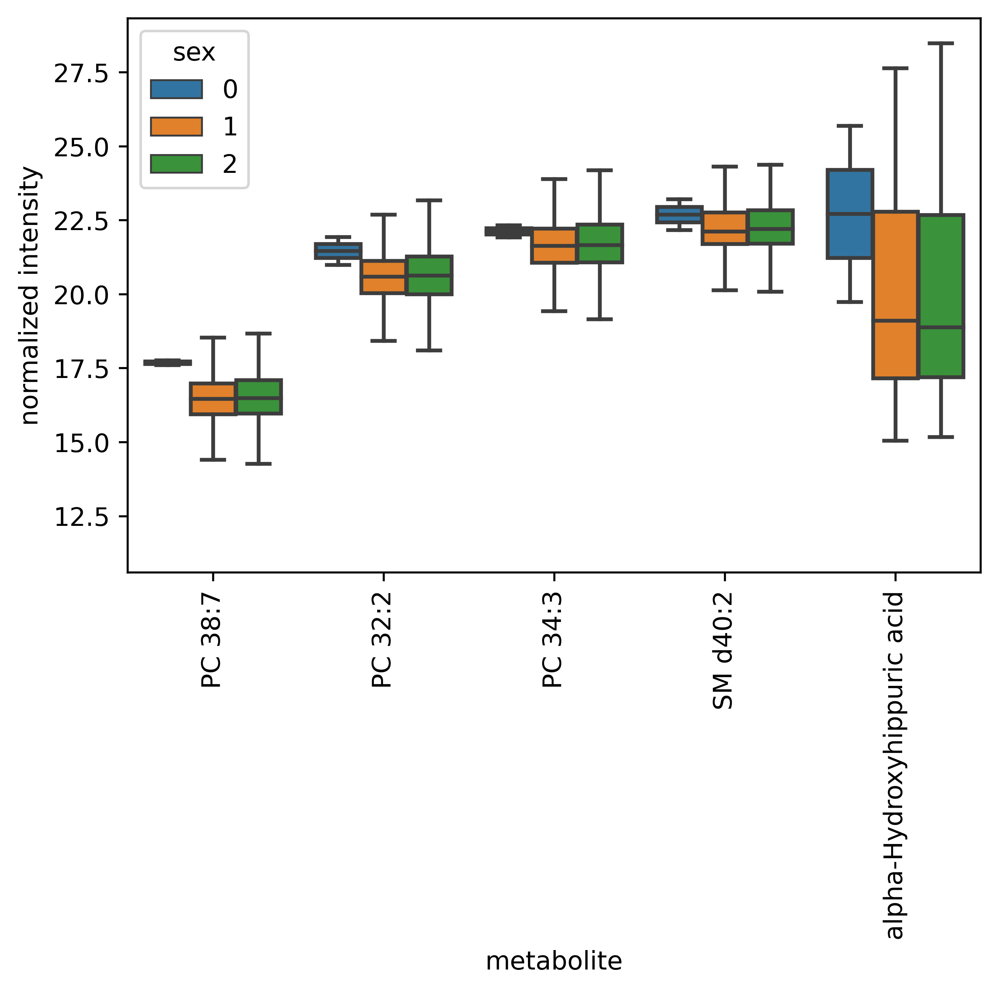

<Figure size 3000x2000 with 0 Axes>

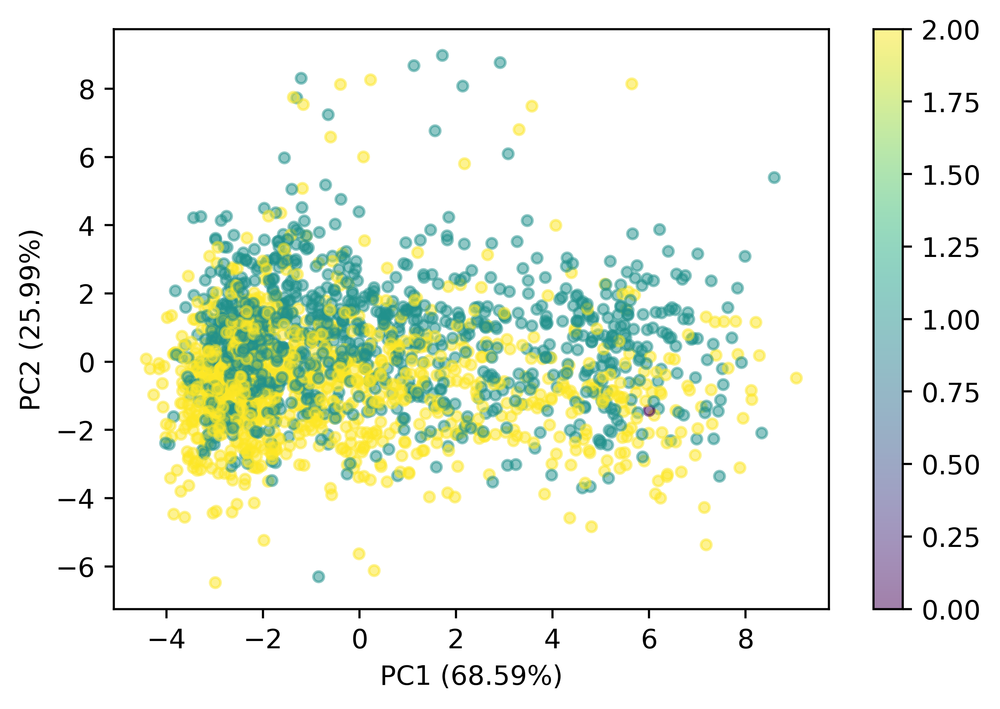

In [7]:
#find sex metabolites
sex = metadata.loc[metadata.index.values[samp_inds],"sex"].values.astype(np.int)
plot_pca(data_mat[samp_inds,:],sex)
plt.figure()
sigMets = []
for met in range(data_mat.shape[1]):
    sexes = list(set(sex))
    sexes.sort()
    ints = [[data_mat[samp_inds[x],met] for x in range(len(samp_inds)) if sex[x] == s] for s in sexes]
    stat,p = stats.f_oneway(*ints)
    fc = np.power(2,np.abs(np.mean(ints[2]) - np.mean(ints[1])))
    if p < 0.05/data_mat.shape[1] and fc >= 1.5:
        sigMets.append(met)
        
plot_dict = {}
for s in sigMets:
    for x in range(len(sex)):
        plot_dict[len(plot_dict)] = {"metabolite":data.columns.values[s],"sex":sex[x],"normalized intensity":data_mat[x,s]}
        
plot_dict = pd.DataFrame.from_dict(plot_dict,orient="index")
sb.boxplot(data=plot_dict,x="metabolite",y="normalized intensity",hue="sex",fliersize=0)
#sb.swarmplot(data=plot_dict,x="metabolite",y="normalized intensity",hue="sex",dodge=True)
plt.xticks(rotation=90)
print(len(sigMets))
print(data.columns.values[sigMets])
plt.figure()
plot_pca(data_mat[samp_inds][:,sigMets],sex)

(25.0, 30.0)

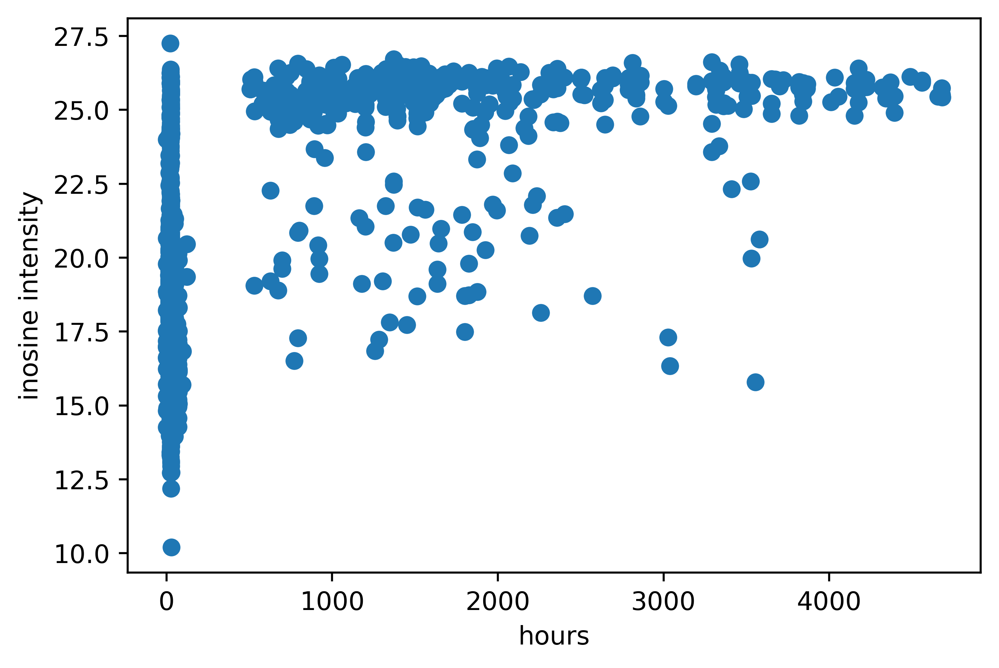

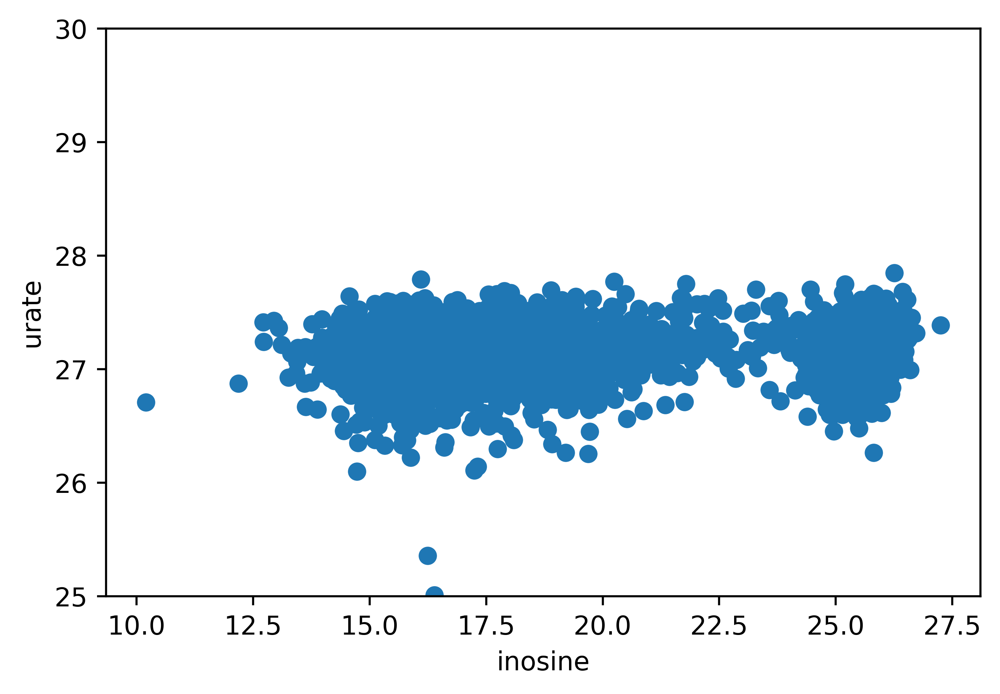

In [8]:
nonDenmarkSamples = [x for x in samp_inds]# if metadata.at[metadata.index.values[x],"fc"] == "DK"]
hours = metadata.loc[metadata.index.values[nonDenmarkSamples],"interval_hrs"].values.astype(np.float)
inosine = list(data.columns.values).index("INOSINE")
urate = list(data.columns.values).index("URATE")
plt.scatter(hours,data_mat[nonDenmarkSamples,inosine])
plt.xlabel("hours")
plt.ylabel("inosine intensity")
plt.figure()
plt.scatter(data_mat[nonDenmarkSamples,inosine],data_mat[nonDenmarkSamples,urate])
plt.xlabel("inosine")
plt.ylabel("urate")
plt.ylim((25,30))

In [17]:
met_mapper = {'INOSINE':"Inosine",
 'N_N-Diethyl-4-hydroxybenzamide':"NDHB",
 '3-Carboxy-4-methyl-5-propyl-2-furanpropanoic acid':"CMPF",
 "NCGC00380721-01_C20H30O4_2-Hydroxy-4_5'_8a'-trimethyl-1'-oxo-4-vinyloctahydro-1'H-spiro[cyclopentane-1_2'-naphthalene]-5'-carboxylic acid":"DTXCID501333287",
 'PYRUVATE':"Pyruvate",
"GLYCEROL":"Glycerol",
          "ISOBUTYRATE":"Isobutyrate",
'DIHYDROOROTATE':"Dihydroorotate",
          'ARGININE':"Arginine",
          'QUINATE':"Quinate",
          "SALICYLATE":"Salicylate",
          "TRIGONELLINE":"Trigonelline",
          "THEOPHYLLINE":"Theophylline",
          "4-PYRIDOXATE":"4-pyridoxate",
          "HIPPURATE":"Hippurate",
          "alpha-Hydroxyhippuric acid":"\u03B1-Hydroxyhippuric acid"}


45
['CE 22:5' 'DG 36:4' 'LPC 20:5/0:0' 'PC 30:0' 'PC 32:1' 'PC 33:1'
 'PC 37:5' 'PC 38:6' 'PC 40:7' 'SM d42:2' 'SM d43:2' 'TG 40:0' 'TG 42:0'
 'TG 46:0' 'TG 47:0' 'TG 48:0' 'TG 49:0' 'TG 56:7' 'TG 58:8' 'TG 60:11'
 'TG 44:0' 'TG 46:1' 'TG 47:1' 'TG 58:7' 'TG 60:12' 'INOSINE'
 'N_N-Diethyl-4-hydroxybenzamide'
 '3-Carboxy-4-methyl-5-propyl-2-furanpropanoic acid' 'Lauryl sulfate'
 'Benzophenone-2'
 "NCGC00380721-01_C20H30O4_2-Hydroxy-4_5'_8a'-trimethyl-1'-oxo-4-vinyloctahydro-1'H-spiro[cyclopentane-1_2'-naphthalene]-5'-carboxylic acid"
 'PYRUVATE' 'GLYCEROL' 'ISOBUTYRATE' 'DIHYDROOROTATE' 'ARGININE' 'QUINATE'
 'SALICYLATE' 'TRIGONELLINE' 'Hydrochlorothiazide' 'Dimethylxanthine'
 'THEOPHYLLINE' '4-PYRIDOXATE' 'HIPPURATE' 'alpha-Hydroxyhippuric acid']


,metabolite,fs,normalized intensity
0,Inosine,BU,1.020696
1,Inosine,BU,0.798423
2,Inosine,BU,1.083087
3,Inosine,BU,0.925817
4,Inosine,PT,0.799493
...,...,...,...
40015,α-Hydroxyhippuric acid,DK,1.155776
40016,α-Hydroxyhippuric acid,DK,1.155503
40017,α-Hydroxyhippuric acid,DK,1.012019
40018,α-Hydroxyhippuric acid,DK,0.881360


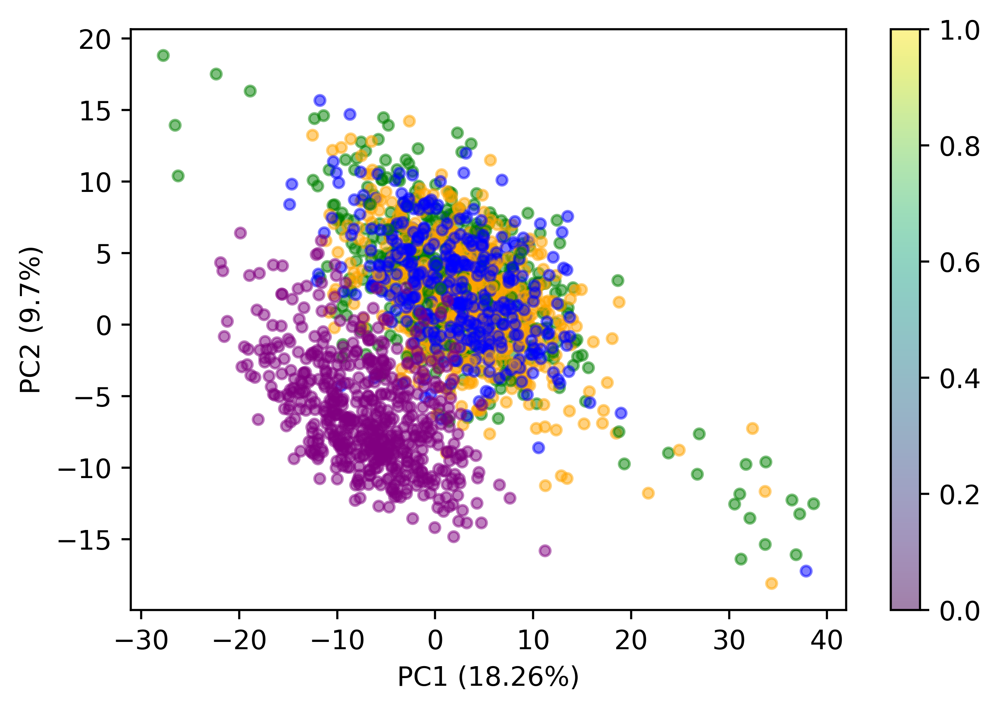

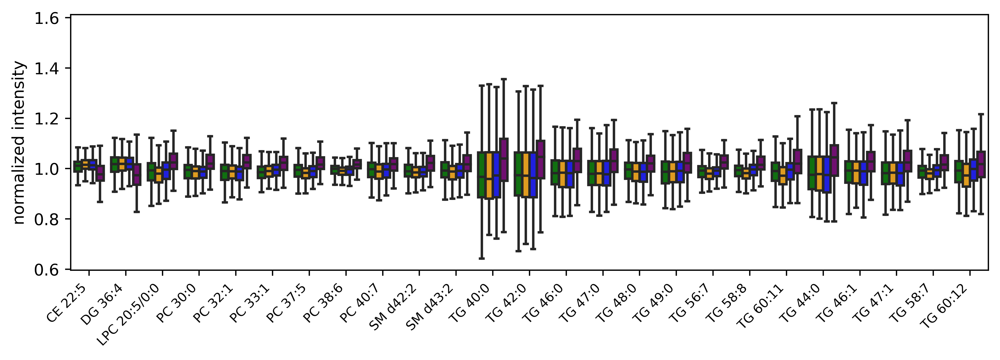

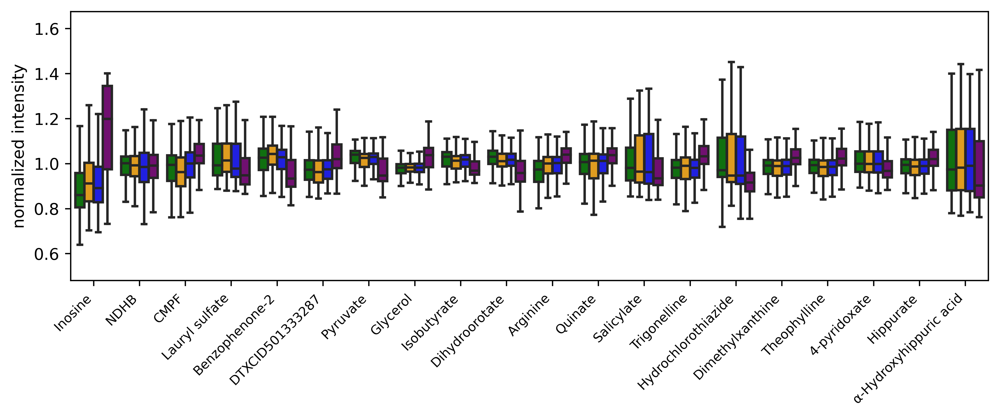

<Figure size 3000x2000 with 0 Axes>

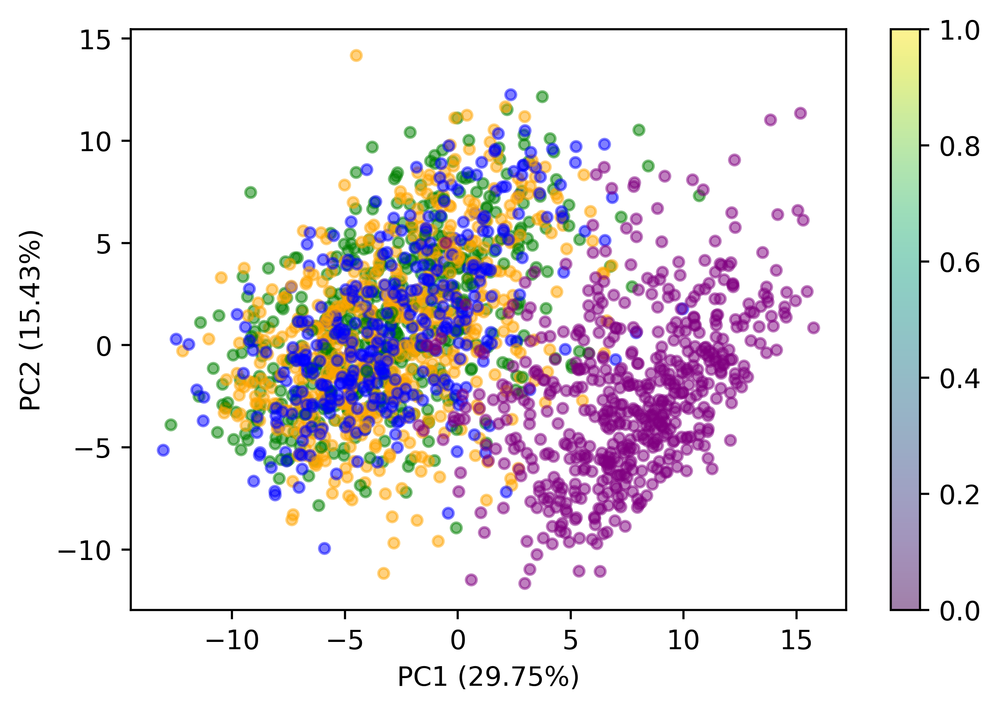

<Figure size 3000x2000 with 0 Axes>

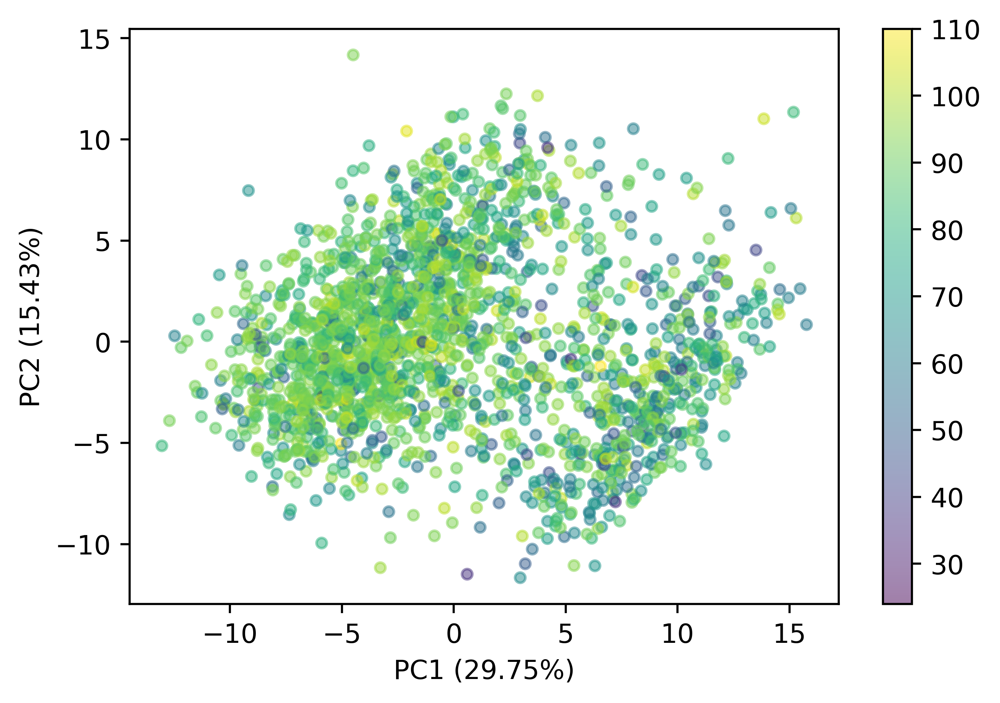

In [32]:
#find location metabolites
fs = metadata.loc[metadata.index.values[samp_inds],"fc"].values
mapper = {"DK":"purple","BU":"green","NY":"blue","PT":"orange"}
fs_colors = np.array([mapper[x] for x in fs])
plot_pca(data_mat[samp_inds,:],fs_colors)
plt.figure(figsize=(8.7,3.2))
sigMets = []
for met in range(data_mat.shape[1]):
    fses = list(set(fs))
    sexes.sort()
    ints = [[data_mat[samp_inds[x],met] for x in range(len(samp_inds)) if fs[x] == s] for s in fses]
    stat,p = stats.f_oneway(*ints)
    meanInts = [np.mean(x) for x in ints]
    fc = np.power(2,np.abs(np.max(meanInts) - np.min(meanInts)))
    #print(met,data.columns.values[met],fc,p)
    if p < 0.05/data_mat.shape[1] and fc >= 2:
        sigMets.append(met)
        
plot_dict = {}
for s in sigMets[:25]:
    norm = np.mean(data_mat[:,s])
    for x in range(len(fs)):
        plot_dict[len(plot_dict)] = {"metabolite":data.columns.values[s],"fs":fs[x],"normalized intensity":data_mat[x,s]/norm}
        
plot_dict = pd.DataFrame.from_dict(plot_dict,orient="index")

def metSwitch(met):
    if met in met_mapper:
        return met_mapper[met]
    else:
        return met

plot_dict["metabolite"] = [metSwitch(x) for x in plot_dict["metabolite"].values]

sb.boxplot(data=plot_dict,x="metabolite",y="normalized intensity",hue="fs",fliersize=0,palette=mapper)
plt.xticks(rotation=45,ha="right",fontsize=8)
plt.legend([],[], frameon=False)
plt.xlabel("")
#plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.tight_layout()
plt.savefig(plotdir + "location_sig_lipids.png")

# plt.figure(figsize=(10,2))
# sb.boxplot(data=plot_dict,x="metabolite",y="normalized intensity",hue="fs",fliersize=0,palette=mapper)
# plt.xticks([])
# plt.legend(bbox_to_anchor=(1.0, 1.0))
# plt.tight_layout()
# plt.savefig(plotdir + "location_sig_lipids_no_labels.png")


plt.figure(figsize=(8.7,3.7))

plot_dict = {}
for s in sigMets[25:]:
    norm = np.mean(data_mat[:,s])
    for x in range(len(fs)):
        plot_dict[len(plot_dict)] = {"metabolite":data.columns.values[s],"fs":fs[x],"normalized intensity":data_mat[x,s]/norm}
        
plot_dict = pd.DataFrame.from_dict(plot_dict,orient="index")
plot_dict["metabolite"] = [metSwitch(x) for x in plot_dict["metabolite"].values]

sb.boxplot(data=plot_dict,x="metabolite",y="normalized intensity",hue="fs",fliersize=0,palette=mapper)
plt.xticks(rotation=45,ha="right",fontsize=8)
plt.legend([],[], frameon=False)
plt.xlabel("")
#plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.tight_layout()
plt.savefig(plotdir + "location_sig_polars.png")

# plt.figure(figsize=(10,2))
# sb.boxplot(data=plot_dict,x="metabolite",y="normalized intensity",hue="fs",fliersize=0,palette=mapper)
# plt.xticks([])
# plt.legend(bbox_to_anchor=(1.0, 1.0))
# plt.tight_layout()
# plt.savefig(plotdir + "location_sig_polars_no_labels.png")


print(len(sigMets))
print(data.columns.values[sigMets])
plt.figure()
plot_pca(data_mat[samp_inds][:,sigMets],fs_colors)
plt.savefig(plotdir + "location_sig_pca.png")

ages = metadata.loc[metadata.index.values[samp_inds],"age"].values.astype(float)
plt.figure()
plot_pca(data_mat[samp_inds][:,sigMets],ages)
plt.savefig(plotdir + "location_age_pca.png")
plot_dict

In [19]:
met_mapper

{'INOSINE': 'Inosine',
 'N_N-Diethyl-4-hydroxybenzamide': 'NDHB',
 '3-Carboxy-4-methyl-5-propyl-2-furanpropanoic acid': 'CMPF',
 "NCGC00380721-01_C20H30O4_2-Hydroxy-4_5'_8a'-trimethyl-1'-oxo-4-vinyloctahydro-1'H-spiro[cyclopentane-1_2'-naphthalene]-5'-carboxylic acid": 'DTXCID501333287',
 'PYRUVATE': 'Pyruvate',
 'GLYCEROL': 'Glycerol',
 'ISOBUTYRATE': 'Isobutyrate',
 'DIHYDROOROTATE': 'Dihydroorotate',
 'ARGININE': 'Arginine',
 'QUINATE': 'Quinate',
 'SALICYLATE': 'Salicylate',
 'TRIGONELLINE': 'Trigonelline',
 'THEOPHYLLINE': 'Theophylline',
 '4-PYRIDOXATE': '4-pyridoxate',
 'HIPPURATE': 'Hippurate',
 'alpha-Hydroxyhippuric acid': 'α-Hydroxyhippuric acid'}

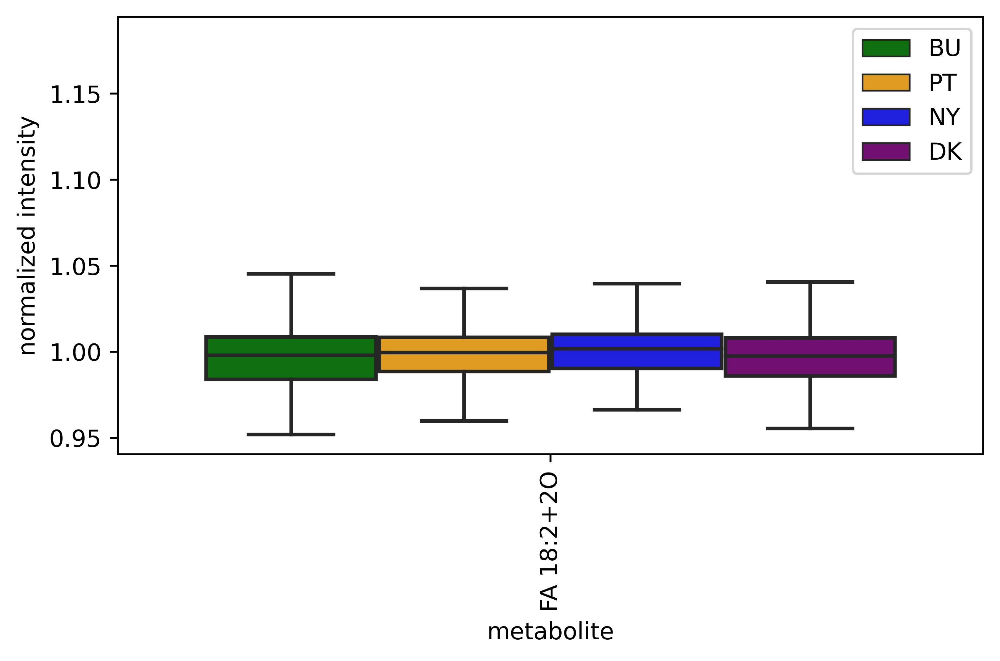

In [12]:
plot_dict = {}
for s in [233]:
    norm = np.mean(data_mat[:,s])
    for x in range(len(fs)):
        plot_dict[len(plot_dict)] = {"metabolite":data.columns.values[s],"fs":fs[x],"normalized intensity":data_mat[x,s]/norm}
        
plot_dict = pd.DataFrame.from_dict(plot_dict,orient="index")
sb.boxplot(data=plot_dict,x="metabolite",y="normalized intensity",hue="fs",fliersize=0,palette=mapper)
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.tight_layout()